In [1]:
import sys
sys.path.append('..')
sys.path.append("..")
sys.path.append("../dl")

import torch
import segmentation_models_pytorch as smp
from omegaconf import OmegaConf
from torch import nn

from config import conf
from inferer import *
from lightning_model import *

/home/leos/.local/lib/python3.6/site-packages/pandas/compat/_optional.py:106: UserWarning: Pandas requires version '1.2.1' or newer of 'bottleneck' (version '1.2.0' currently installed).
  warnings.warn(msg, UserWarning)
/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192

/usr/lib/python3.6/importlib/_bootstrap.py:219: ImportWarning:

can't resolve package from 

In [2]:
model = smp.FPN(
    encoder_name="resnext50_32x4d",
    classes=2,
    decoder_merge_policy='cat'
)

PATH = Path(conf['paths']['experiment_root_dir'])
PATH = PATH.joinpath((f"{conf['training_args']['model_name']}/"
                      f"version_{conf['training_args']['experiment_version']}"))
PATH = PATH.joinpath(f"last.ckpt")

segmodel = SegModel.from_conf(model, conf)
checkpoint = torch.load(PATH, map_location = lambda storage, loc : storage)
segmodel.load_state_dict(checkpoint['state_dict'])

<All keys matched successfully>

In [3]:
inf = Inferer.from_conf(segmodel, conf)

In [4]:
infobj = inf.run()

Prediction for: test_1


/home/leos/.local/lib/python3.6/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function extract_patches is deprecated; The function feature_extraction.image.extract_patches has been deprecated in 0.22 and will be removed in 0.24.



Prediction for: test_10
Prediction for: test_11
Prediction for: test_12
Prediction for: test_13
Prediction for: test_14
Prediction for: test_2
Prediction for: test_3
Prediction for: test_4
Prediction for: test_5
Prediction for: test_6
Prediction for: test_7
Prediction for: test_8
Prediction for: test_9


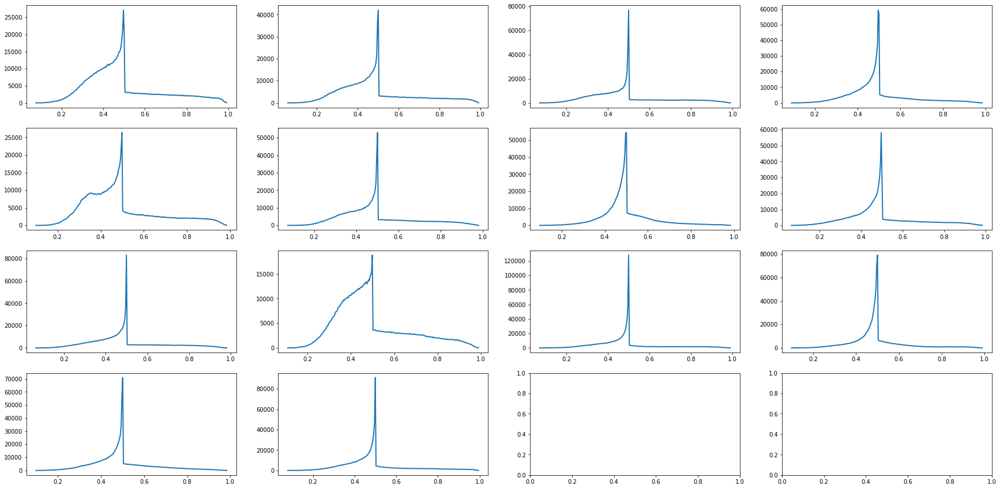

In [5]:
inf.plot_histograms()

In [6]:
# inf.save_outputs('pöö/pö/pöö/image.png')

In [7]:
# inf.plot_predictions()

In [8]:
inf.post_process()

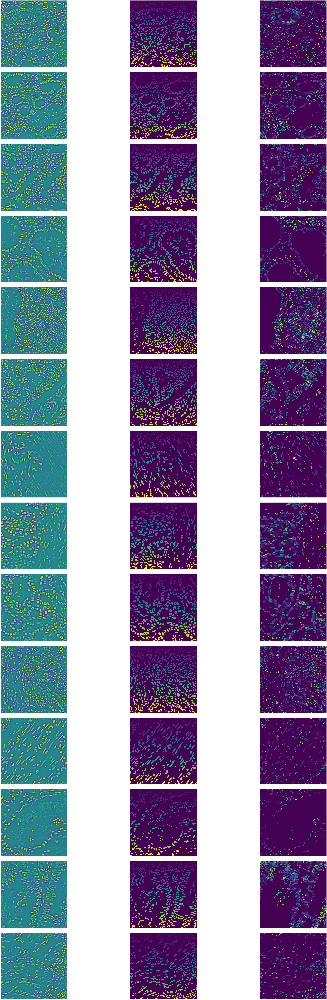

In [9]:
inf.plot_segmentations()

In [10]:
inf.benchmark()

,AJI,AJI plus,DICE2,PQ,SQ,DQ,inst Sensitivity,inst Precision,splits,merges
test_1_metrics,0.317342,0.377275,0.465572,0.264121,0.676688,0.390313,0.316763,0.508349,1.121762,1.072294
test_10_metrics,0.367716,0.410079,0.532856,0.352910,0.716057,0.492852,0.428402,0.580128,0.939532,0.971047
test_11_metrics,0.284583,0.369746,0.429925,0.189657,0.666352,0.284620,0.207057,0.455102,0.906149,1.388015
test_12_metrics,0.365900,0.389796,0.595206,0.330542,0.698250,0.473386,0.488318,0.459341,1.141165,0.625160
test_13_metrics,0.392755,0.429686,0.600094,0.368951,0.684247,0.539207,0.450331,0.671789,0.829718,1.515427
test_14_metrics,0.469469,0.488368,0.669342,0.429617,0.702380,0.611659,0.613309,0.610018,1.075629,0.912197
test_2_metrics,0.339915,0.369475,0.534895,0.227689,0.656795,0.346667,0.371429,0.325000,0.944164,0.534787
test_3_metrics,0.407917,0.441926,0.571522,0.307975,0.691562,0.445333,0.423858,0.469101,0.823466,1.125248
test_4_metrics,0.446131,0.490860,0.575333,0.352486,0.697850,0.505102,0.473684,0.540984,0.808520,1.174508
test_5_metrics,0.374407,0.427094,0.519487,0.342589,0.702770,0.487484,0.406593,0.608553,0.968294,1.422948
